In [322]:
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [323]:

#least squares solution of one line segment
#return a=slope, b=y-intercept, e=square error
def lscoefs(xarr,yarr):
    n = len(xarr)
    fit1 = np.polyfit(xarr, yarr, 2)
    a, b, c = fit1[0], fit1[1], fit1[2]
    e = 0
    for i in range(n):
        poly_val = a*xarr[i] ** 2 + b*xarr[i] + c 
        e += (yarr[i] - poly_val)**2
    return (a,b,c,e)

#precompute all least squares coefs for all pairs of points i <= j
#result is a list of lists, one per j, each entry in sublist is a 
#tuple for an i
#each tuple is the ls coefs a, b and the error, for that segment (i,j)
def precompute(n,xarray,yarray):
    result = [[(0,0,0,10000)], [(0,0,0,1000), (0,0,0,1000)]]
    for j in range(2,n):
        jres = []
        for i in range(0,j+1):
            if n - j >= 2:
                a,b,c,e = lscoefs(xarray[i:j+1],yarray[i:j+1])     
                jres = jres + [(a,b,c,e)]
        if len(jres) > 0:
            result = result + [jres]
    return (result)       

#estimate variance of y array to use in computing segment penalty in
#finding opt solution
def estvariance(n,yarray):
    meany = sum(yarray)/n
    sqrdiffy = [(y-meany)*(y-meany) for y in yarray]
    yvar = sum(sqrdiffy)/n
    return yvar
    
    
#dynamic programming solution using precomputed results
def findopt(n,preresult,C):
    optresult = []  
    for j in range(len(preresult)):
        beste = 9e999
        besti = -1
        jpre = preresult[j]   #list of tuples (a,b,c) for i=0,1,...,j
        #for each possible start i, up to j
        for i in range(0,j+1):
            #get the error assuming using opt to to i-1, and new fit for i..j,
            #with penalty per segment, C
            if (i > 0):
                e = jpre[i][3] + optresult[i-1][0] + C
            else:
                e = jpre[i][3] + C
            #find i with smallest error            
            if (e < beste):
                beste = e
                besti = i
        #create opt entry for j, consisting of min error and list of of (i,j) 
        #this is this a list of (i,j) segments for this j, consisting of
        #the current best (i,j) appended to list from opt[besti-1]
        if (besti > 0):
            optresult = optresult + [[beste, optresult[besti-1][1] + [(besti,j)]]] 
        else:
            optresult = optresult + [[beste, [(besti,j)]]]
    return optresult[n-2]
    
#constuct fitted line from optimum solution 
def constructfit(n,xarray,yarray,preresult,opt):
    yfit = []
    optintervals = opt[1]    #list of tuples (opt has error and list of tuples)
    #for each segment    
    phrases = []
    for interval in optintervals:
        i=interval[0]        #get the segment
        j=interval[1]
        phrases.append((i, j))
        a = preresult[j][i][0]    #get the ls coeffs for the segment
        b = preresult[j][i][1]
        c = preresult[j][i][2]
        xarr = xarray[i:j+1]
        yfit = yfit + [a*x**2 + b*x + c for x in xarr]   #build up fit
    return yfit, phrases
    
    
#segmented least squares
def segls(n,xarray,yarray,Cfactor):
    preresult = precompute(n,xarray,yarray)  #precompute ls coefs and errors
    yvar = estvariance(n,yarray)
    C = Cfactor * yvar                       #penalty for adding segments
    opt = findopt(n,preresult,C)             #optimum solution
    yfit, phrases = constructfit(n,xarray,yarray,preresult,opt)   #compute fit  
    return yfit, phrases

In [324]:
import librosa

In [325]:
x, sr = librosa.load("recordings/rec1.mp3")
y, sr = librosa.load("recordings/rec2.mp3")

In [328]:
def get_bpms(x, time_increment):
    start, end = 0, time_increment
    duration = librosa.get_duration(x)

    bpms = np.array([])
    while end < duration:
        i, j = librosa.time_to_samples(start), librosa.time_to_samples(end)
        audio = x[i:j]
        bpm, beats = librosa.beat.beat_track(y=audio, sr=sr)
        bpms = np.append(bpms, bpm)
        start += time_increment
        end += time_increment
    return bpms

def get_plp(x):
    return librosa.beat.plp(x, sr=sr)

(115,)


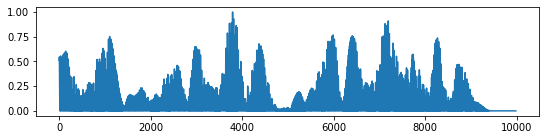

In [330]:
# x_bpms, y_bpms = get_bpms(x, 2), get_bpms(y, 3)
print(x_bpms.shape)
x_bpms = get_plp(x)
xs = np.arange(len(x_bpms))
ys = np.arange(len(y_bpms))

plt.figure(figsize=(9,2))
plt.plot(xs, x_beats)
# x_fitted, x_phrases = segls(len(x_bpms), xs, x_bpms, 4)
# y_fitted, y_phrases = segls(len(y_bpms), ys, y_bpms, 4)

[(0, 3), (4, 6), (7, 31), (32, 34), (35, 52), (53, 55), (56, 98), (99, 109), (110, 113)]
[(0, 30), (31, 46), (47, 51), (52, 55), (56, 62)]


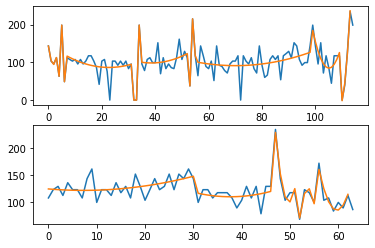

<Figure size 648x144 with 0 Axes>

In [271]:
fig, ax = plt.subplots(2)

plt.figure(figsize=(9,2))
ax[0].plot(xs, x_bpms)
ax[0].plot(np.arange(len(x_bpms) - 1), x_fitted)
print(x_phrases)

ax[1].plot(ys, y_bpms)
ax[1].plot(np.arange(len(y_bpms) - 1), y_fitted)
print(y_phrases)

In [490]:
import IPython.display as ipd

In [332]:
tempo_range, phase_range = 47, 57
phrase_cost, tempo_cost = 1.4, 1.8
beats = [0, 2.0, 3.0, 5.0, 6.0]

cost_matrices = []

def get_minimum_cost(time, beat_period):
    minimum_cost = float('inf')
    min_x, min_y = float('inf'), float('inf')
    prev_matrix = cost_matrices[len(cost_matrices) - 1]
    
    for x in range(phase_range):
        for y in range(tempo_range):
            cost = prev_matrix[time - x - y, beat_period - y] + phase_cost * x + tempo_cost * y
            if cost < minimum_cost:
                minimum_cost = cost
                min_x, min_y = x, y
    return minimum_cost
            
def update_cost_matrix(beat_times):
    N = len(beat_times)
    
    cost_matrix = [[0] * phase_range] * tempo_range
    
    for i in range(tempo_range):
        for j in range(phase_range):
            cost_matrix[i][j] = get_minimum_cost(i, j)
    

In [477]:
import csv
def parse_tempo_csv(filename):
    tempo_arr = []
    with open(filename) as csvfile:
        temporeader = csv.reader(csvfile, delimiter=' ', quotechar='|')
        temporeader = list(temporeader)[1:]
        last_tempo, start = None, None
        for row in temporeader:
            tempo_predictions = row[0].split(',')
            last_tempo = np.argmax(tempo_predictions)
            offset = 30
            tempo_arr.append(last_tempo + offset)
    return tempo_arr

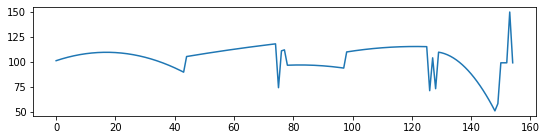

In [389]:
t1 = parse_tempo_csv('rec1.mp3.csv', 20)
xt1 = np.arange(len(t1))

x_fitted, x_phrases = segls(len(t1), xt1, t1, 4)

plt.figure(figsize=(9,2))
# plt.plot(xt1, t1)
plt.plot(np.arange(len(x_fitted)), x_fitted)

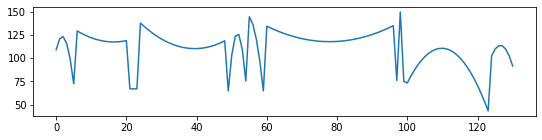

In [390]:
t2 = parse_tempo_csv('rec2.mp3.csv',20)
xt2 = np.arange(len(t2))

xt2_fitted, xt2_phrases = segls(len(t2), xt2, t2, 4)


plt.figure(figsize=(9,2))
# plt.plot(xt2, t2)

plt.plot(np.arange(len(xt2_fitted)), xt2_fitted)


In [513]:
def graph_tempo(filename, original=False):
    t2 = parse_tempo_csv(filename)
    xt2 = np.arange(len(t2))

    xt2_fitted, xt2_phrases = segls(len(t2), xt2, t2, 4)    
    plt.figure(figsize=(9,2))
    if original:
        plt.plot(xt2, t2)

    plt.plot(np.arange(len(xt2_fitted)), xt2_fitted)
    return xt2_fitted, xt2_phrases


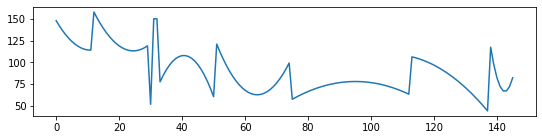

In [514]:
fitted, p1 = graph_tempo('recordings/widmung/2.mp3.csv')

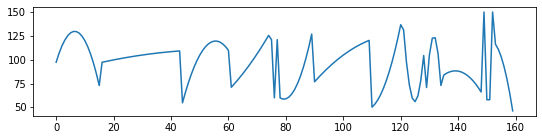

In [515]:
p2 = graph_tempo('recordings/widmung/3.csv')

In [486]:
print(len(fitted))
print(p1)

146
[(0, 11), (12, 29), (30, 32), (33, 50), (51, 74), (75, 112), (113, 137), (138, 145)]


In [466]:
r1, sr = librosa.load('recordings/widmung/2.mp3')
r3, sr = librosa.load('recordings/widmung/3.m4a')

In [493]:
f = 0.67291259765625
r1_clips = [get_phrase_audio(r1, a, f) for a in p1]
r3_clips = [get_phrase_audio(r3, a, f) for a in p2]

In [501]:
ipd.Audio(r3_clips[3], rate=sr)

In [492]:
def get_phrase_audio(y, phrase, frequency):
    period = 1/frequency
    i, j = librosa.time_to_samples(phrase[0] * period), librosa.time_to_samples(phrase[1] * period)
    audio = y[i:j]
    return audio

In [494]:
len(r1_clips)

8